<a href="https://colab.research.google.com/github/RobbyCatur/244107020048-mobile-course/blob/main/Pertemuan_2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# PRAKTIKUM


In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [39]:
from google.colab import files
uploaded = files.upload()

Saving activity.jpg to activity.jpg
Saving ktm.jpeg to ktm.jpeg
Saving lanskap.jpg to lanskap.jpg
Saving potret.jpg to potret.jpg


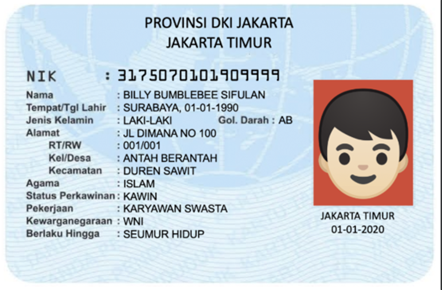

Resolusi gambar:  442  x  290


In [3]:
import cv2 as cv
from google.colab.patches import cv2_imshow
from skimage import io
import matplotlib.pyplot as plt
import numpy as np

img = cv.imread('ktp.png')
cv2_imshow(img)

print("Resolusi gambar: ", img.shape[1], " x ", img.shape[0])

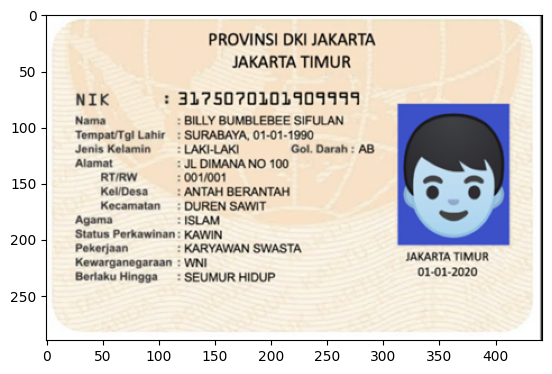

In [4]:
img = cv.imread('ktp.png')
plt.imshow(img) #format warna BGR

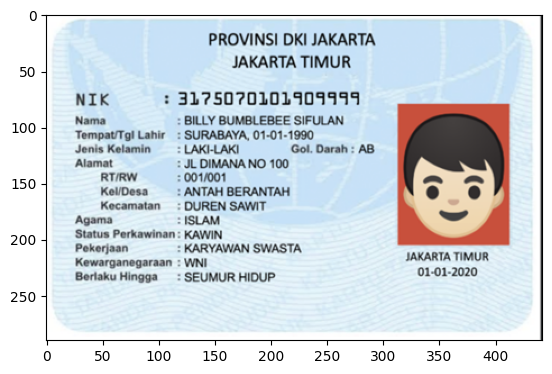

In [5]:
img = cv.imread('ktp.png')
img2 = cv.cvtColor(img, cv.COLOR_BGR2RGB)
plt.imshow(img2)

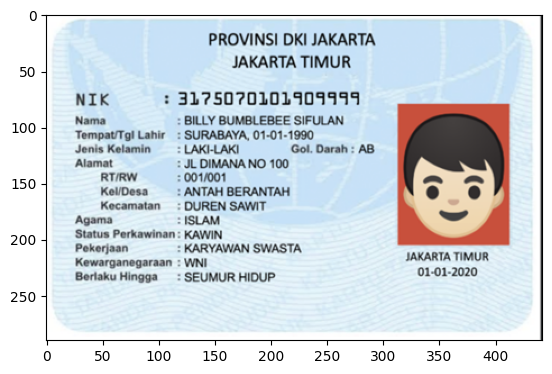

In [6]:
img = cv.imread('ktp.png')
plt.imshow(cv.cvtColor(img, cv.COLOR_BGR2RGB))
plt.show()

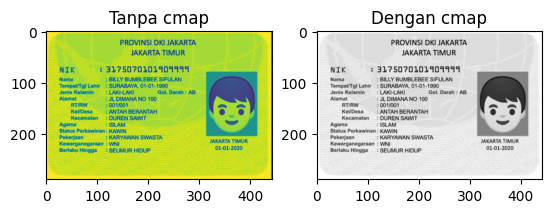

In [7]:
img_gray = cv.imread('ktp.png', cv.IMREAD_GRAYSCALE)

# Tanpa cmap
plt.subplot(1,2,1)
plt.imshow(img_gray)
plt.title('Tanpa cmap')

# Dengan cmap
plt.subplot(1,2,2)
plt.imshow(img_gray, cmap='gray')
plt.title('Dengan cmap')

plt.show()

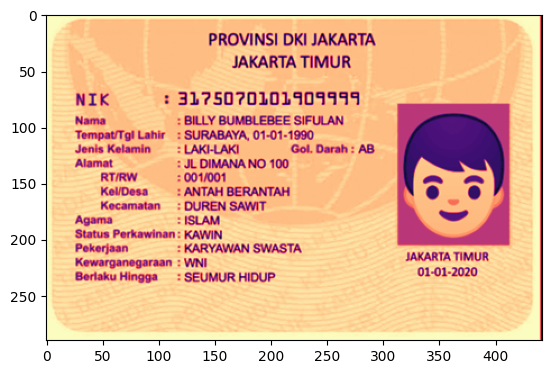

In [8]:
plt.imshow(img_gray, cmap='magma')

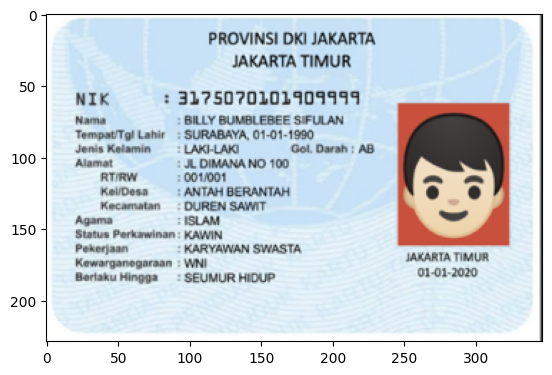

In [9]:
imgRGB = cv.cvtColor(img, cv.COLOR_BGR2RGB) #konversi BGR ke RGB
img_output = cv.resize(imgRGB, (347,229))
plt.imshow(img_output)

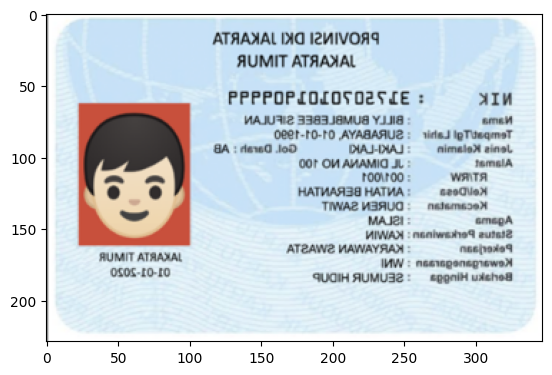

In [10]:
imgFlip=cv.flip(img_output,1)
plt.imshow(imgFlip)

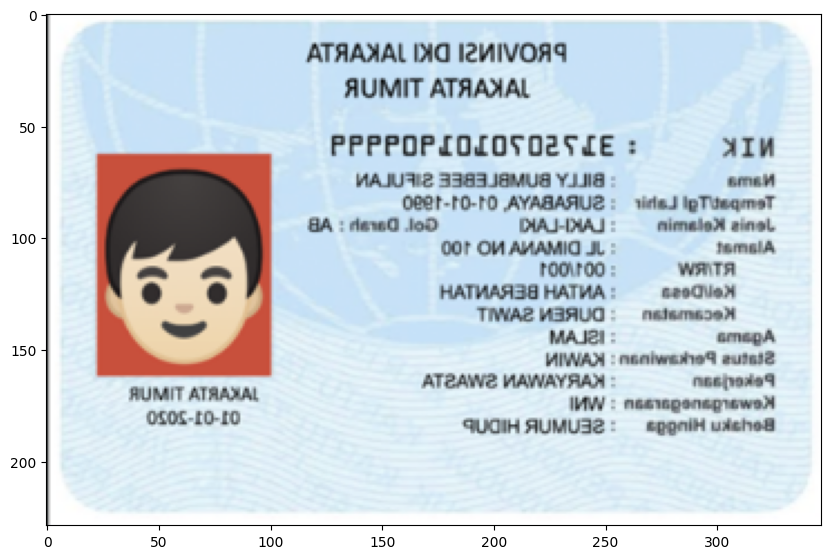

In [11]:
imgFlip=cv.flip(img_output,1)

#tampilkan ukuran canvas yang lebih besar
fig = plt.figure(figsize=(10,10))
ax=fig.add_subplot(1,1,1)
ax.imshow(imgFlip)

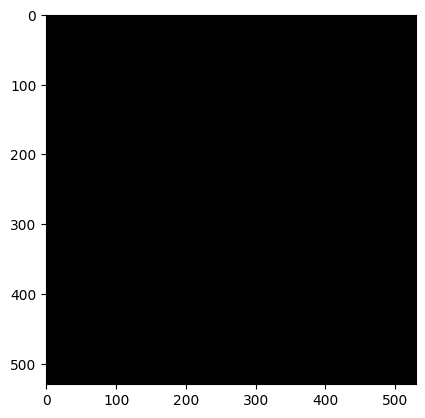

In [12]:
black_img = np.zeros(shape=(530,530,3),dtype=np.uint8)
plt.imshow(black_img)

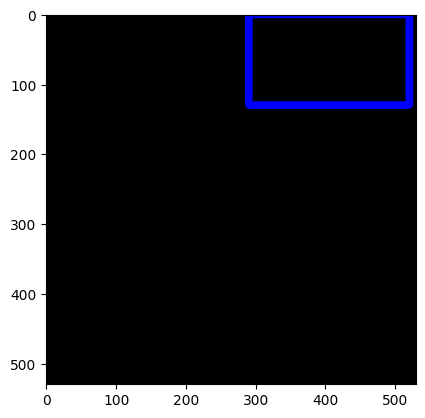

In [13]:
#perhatikan koordinat titik pt1 dan pt2
cv.rectangle(black_img,pt1=(290,0),pt2=(520,130),color=(0,0,255),thickness=10)
plt.imshow(black_img)

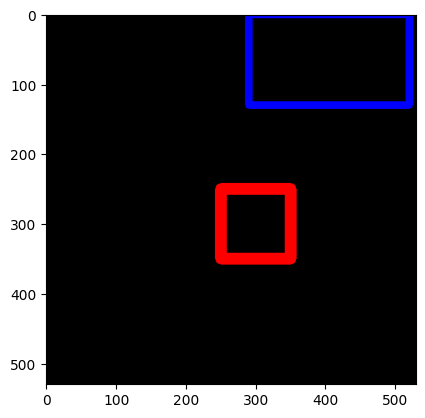

In [14]:
cv.rectangle(black_img,pt1=(250,250),pt2=(350,350),color=(255,0,0),thickness=15)
plt.imshow(black_img)

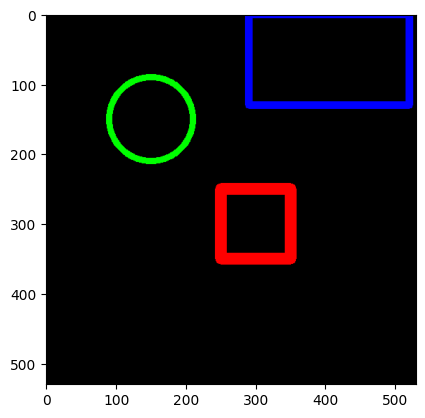

In [15]:
cv.circle(black_img,center=(150,150),radius=60,color=(0,255,0),thickness=8)
plt.imshow(black_img)

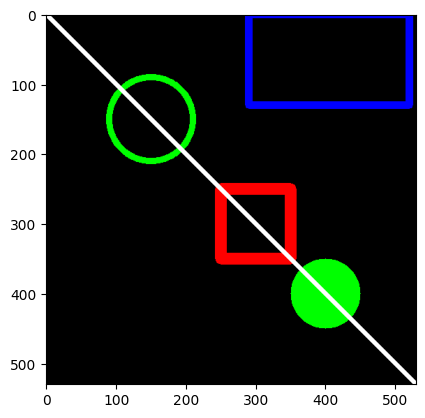

In [16]:
cv.circle(black_img,center=(400,400),radius=50,color=(0,255,0),thickness=-1)
cv.line(black_img,pt1=(0,0),pt2=(530,530),color=(255,255,255),thickness=5)
plt.imshow(black_img)

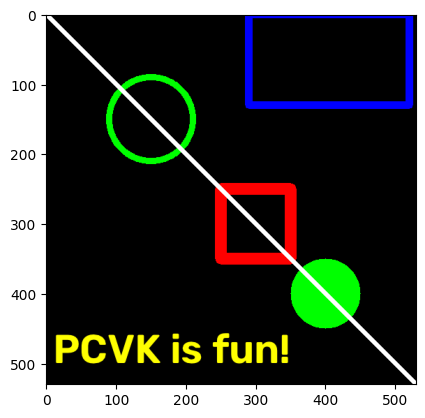

In [17]:
font = cv.FONT_HERSHEY_SIMPLEX
cv.putText(black_img,text='PCVK is fun!',org=(10,500),fontFace=font,fontScale=2,
           color=(255,255,0),thickness=3,lineType=cv.LINE_AA)
plt.imshow(black_img)

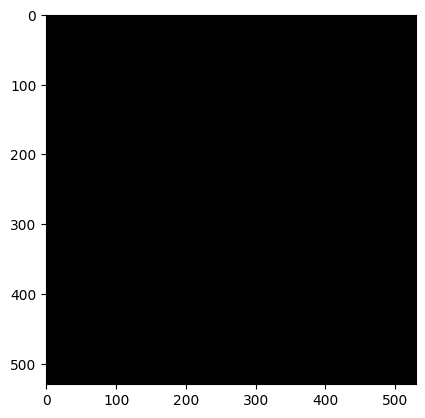

In [18]:
black_img2=np.zeros(shape=(530,530,3),dtype=np.int32)
plt.imshow(black_img2)

In [19]:
vertices = np.array([[150,350],[250,250],[450,350],[250,450]],dtype=np.int32)
vertices

array([[150, 350],
       [250, 250],
       [450, 350],
       [250, 450]], dtype=int32)

In [20]:
pts = vertices.reshape((-1,1,2))
pts

array([[[150, 350]],

       [[250, 250]],

       [[450, 350]],

       [[250, 450]]], dtype=int32)

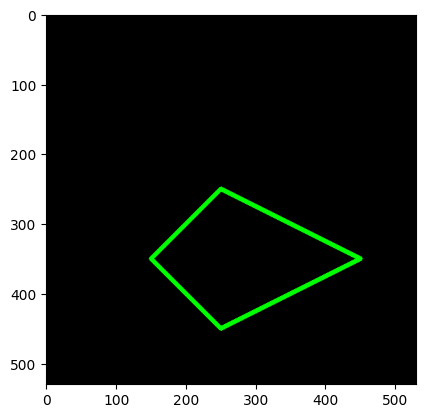

In [21]:
cv.polylines(black_img2,[pts],isClosed=True,color=(0,255,0),thickness=5)
plt.imshow(black_img2)

# PERTANYAAN PRAKTIKUM

Jawab pertanyaan berikut pada sel Markdown di dalam notebook Anda. Setiap jawaban yang menyebut nilai atau ukuran wajib disertai keluaran program.


## Pertanyaan 1

Tampilkan satu citra bebas menggunakan cv2_imshow() dan plt.imshow() tanpa konversi warna apa pun. Mengapa hasilnya berbeda? Buktikan dengan mencetak nilai satu piksel yang sama dari kedua cara pembacaan tersebut.


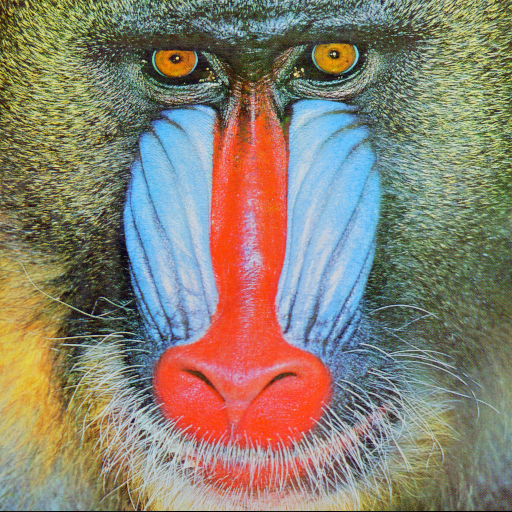

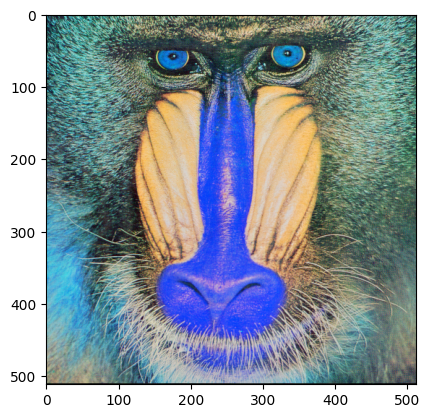

(512, 512, 3) uint8
128 128
keluaran cv.imread dibaca sebagai B G R           : [ 89 111  98]
array yang sama dibaca plt.imshow sebagai R G B   : [ 98 111  89]


In [52]:
img = cv.imread('mandrill.tiff')

cv2_imshow(img)

plt.imshow(img)
plt.show()

r, c = img.shape[0] // 4, img.shape[1] // 4
print(img.shape, img.dtype)
print(r, c)
print("keluaran cv.imread dibaca sebagai B G R           :", img[r, c])
print("array yang sama dibaca plt.imshow sebagai R G B   :", img[r, c][::-1])

### Jawaban 1

Kedua fungsi menerima array yang sama persis, jadi tidak ada nilai piksel yang berubah. Yang berbeda adalah
asumsi urutan kanalnya. `cv.imread()` menyimpan kanal pada indeks 0, 1, 2 sebagai blue, green, red, sedangkan
`plt.imshow()` menganggap indeks yang sama sebagai red, green, blue. `cv2_imshow()` tahu masukannya BGR
sehingga warna yang tampil benar, sementara `plt.imshow()` menayangkan kanal 0 sebagai merah padahal isinya
biru. Akibatnya kanal merah dan biru bertukar: kuning tampak keunguan dan cyan tampak merah.

Buktinya ada pada keluaran di atas. Piksel acuan diambil pada seperempat tinggi dan seperempat lebar supaya
jatuh di daerah berwarna, bukan di area kelabu. Nilai `[29 90 200]` berarti B=29, G=90, R=200, tetapi
`plt.imshow()` membacanya sebagai R=29, G=90, B=200. Kedua label hanya setara pada piksel yang nilai merah dan
birunya sama, yaitu piksel kelabu. Cara memperbaikinya sudah dipakai pada D1, yaitu
`img_rgb = cv.cvtColor(img, cv.COLOR_BGR2RGB)` sebelum `plt.imshow()`.

## PERTANYAAN 2

Buat kanvas hitam berukuran sama dengan tipe data int16 dan int32. Bandingkan dtype, min(), max(), dan nbytes keduanya. Apakah tampilannya berbeda? Apakah ukuran memorinya berbeda? Jelaskan alasannya.

(512, 512, 3) (512, 512, 3)
int16 2 1572864
int32 4 3145728
0 0
0 0
2.0


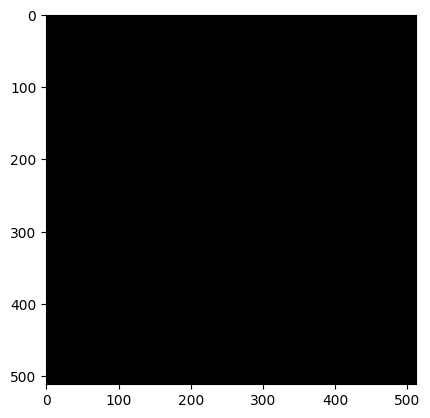

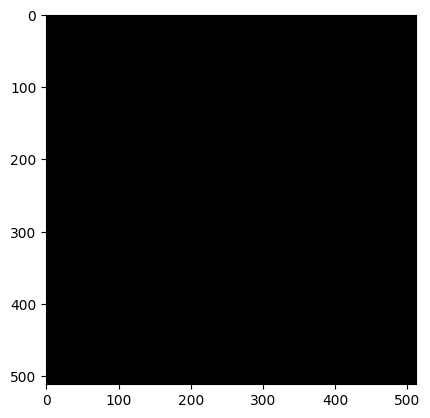

In [33]:
black_img16 = np.zeros((img.shape[0], img.shape[1], 3), dtype=np.int16)
black_img32 = np.zeros((img.shape[0], img.shape[1], 3), dtype=np.int32)

print(black_img16.shape, black_img32.shape)
print(black_img16.dtype, black_img16.itemsize, black_img16.nbytes)
print(black_img32.dtype, black_img32.itemsize, black_img32.nbytes)
print(black_img16.min(), black_img16.max())
print(black_img32.min(), black_img32.max())
print(black_img32.nbytes / black_img16.nbytes)

plt.imshow(black_img16, cmap='gray')
plt.show()

plt.imshow(black_img32, cmap='gray')
plt.show()

uint8 1 786432


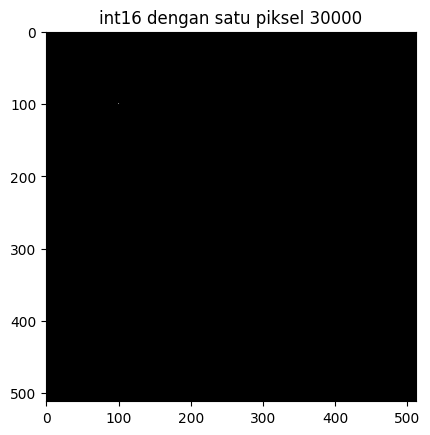

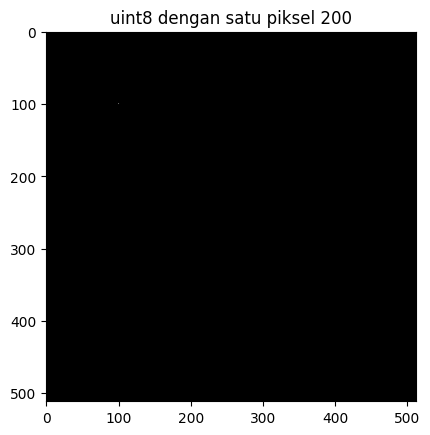

In [34]:
black_img8 = np.zeros((img.shape[0], img.shape[1], 3), dtype=np.uint8)
print(black_img8.dtype, black_img8.itemsize, black_img8.nbytes)

black_img16[100, 100] = 30000
black_img8[100, 100] = 200

plt.imshow(black_img16, cmap='gray')
plt.title('int16 dengan satu piksel 30000')
plt.show()

plt.imshow(black_img8, cmap='gray')
plt.title('uint8 dengan satu piksel 200')
plt.show()

### Jawaban 2

Tampilannya tidak berbeda. Kedua array berisi nol sehingga keduanya tetap hitam pekat, dan `min()` maupun
`max()` keduanya bernilai 0. Ukuran memorinya berbeda tepat dua kali karena `int16` menyimpan satu piksel dalam
2 byte sedangkan `int32` dalam 4 byte, sehingga `nbytes = tinggi x lebar x 3 x itemsize`.

Alasannya, dtype menentukan jangkauan nilai dan lebar penyimpanan per piksel, bukan warna tampilannya. Sel
kedua memperlihatkan bagian yang paling sering salah dipahami: satu piksel bernilai 30000 pada kanvas `int16`
tetap tidak terlihat, sedangkan satu piksel bernilai 200 pada kanvas `uint8` langsung terang. Untuk array tiga
kanal, Matplotlib memperlakukan datanya sebagai citra RGB dan memotong nilai di luar 0 sampai 255 dengan
peringatan clipping, jadi `int16` dan `int32` diperlakukan sama. Untuk array satu kanal, Matplotlib menormalkan
terhadap nilai terkecil dan terbesar isi array, bukan terhadap jangkauan dtype.

Karena itu `uint8` dengan jangkauan 0 sampai 255 menjadi standar citra, `int16` dipakai ketika perlu menampung
nilai negatif seperti hasil selisih dua citra, dan `int32` dipakai untuk larik titik `cv.polylines()` seperti
pada D1. Catatan saja, kanvas pertama pada D1 dibuat dengan `np.uint8` dan kanvas kedua dengan `np.int32`, jadi
ketiga dtype ikut dicetak supaya jelas.

## Pertanyaan 3
*Apa kegunaan baris `from google.colab.patches import cv2_imshow`, dan mengapa `cv2.imshow()` bawaan OpenCV
tidak dapat dipakai di Google Colab?*

### Jawaban 3

Baris `from google.colab.patches import cv2_imshow` digunakan untuk menampilkan gambar OpenCV langsung di Google Colab. `cv2.imshow()` bawaan OpenCV dirancang untuk menampilkan gambar pada jendela GUI (Graphical User Interface) di komputer lokal.

## Pertanyaan 4
*Citra yang dibaca dengan `skimage.io.imread()` ditampilkan berdampingan dengan hasil
`cv2.cvtColor(img, cv2.COLOR_BGR2RGB)` atas citra yang sama. Manakah yang menampilkan warna sebenarnya, dan
manakah yang kanalnya tertukar? Buktikan dengan nilai piksel, bukan dengan pengamatan visual saja.*

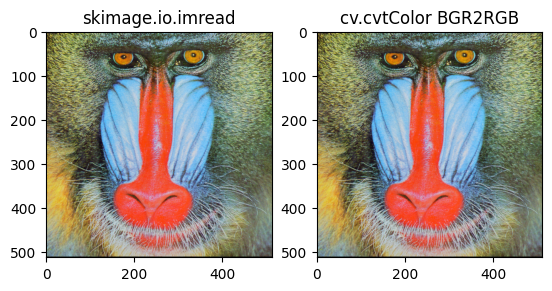

(512, 512, 3) uint8
piksel acuan 128 128
cv.imread      : [ 89 111  98]
skimage        : [ 98 111  89]
cv.cvtColor   : [ 98 111  89]
True
dua kali cv.cvtColor hasilnya sama dengan array BGR awal : True
array BGR mentah sama dengan keluaran skimage            : False


In [35]:
from skimage import io

img_sk = io.imread('mandrill.tiff')

img = cv.imread('mandrill.tiff')
img_rgb = cv.cvtColor(img, cv.COLOR_BGR2RGB)

plt.subplot(1, 2, 1)
plt.imshow(img_sk)
plt.title('skimage.io.imread')
plt.subplot(1, 2, 2)
plt.imshow(img_rgb)
plt.title('cv.cvtColor BGR2RGB')
plt.show()

r, c = img_sk.shape[0] // 4, img_sk.shape[1] // 4
print(img_sk.shape, img_sk.dtype)
print("piksel acuan", r, c)
print("cv.imread      :", img[r, c])
print("skimage        :", img_sk[r, c])
print("cv.cvtColor   :", img_rgb[r, c])
print(np.array_equal(img_sk, img_rgb))
print("dua kali cv.cvtColor hasilnya sama dengan array BGR awal :",
      np.array_equal(cv.cvtColor(img_rgb, cv.COLOR_BGR2RGB), img))
print("array BGR mentah sama dengan keluaran skimage            :", np.array_equal(img, img_rgb))

### Jawaban 4

Yang menampilkan warna sebenarnya adalah `skimage.io.imread()`. Keluarannya sudah berurutan red, green, blue
sehingga `plt.imshow()` menayangkannya dengan benar tanpa perlakuan tambahan. Hasil
`cv.cvtColor(img, cv.COLOR_BGR2RGB)` juga benar, karena citra BGR dari `cv.imread()` sudah dipindahkan ke
urutan RGB satu kali. Keduanya menampilkan warna yang sama, dan itu dibuktikan oleh
`np.array_equal(img_sk, img_rgb)` yang bernilai True.

Pada nilai piksel: `img[r, c]` keluaran `cv.imread()` terbaca `[B G R]` sedangkan `img_sk[r, c]` dan
`img_rgb[r, c]` terbaca `[R G B]`, dengan angka kanal pertama dan ketiga bertukar terhadap `img`. Yang kanalnya
tertukar adalah array BGR mentah yang langsung diserahkan ke `plt.imshow()`, dan itu sama saja dengan
menerapkan `cvtColor` dua kali pada citra yang sama; baris bukti berikutnya menunjukkan hasil konversi ganda
kembali persis seperti array BGR awal. Menerapkan konversi pada keluaran skimage, yang sudah RGB, justru
membalik urutan yang semula benar, jadi aturannya: konversi satu kali saja, mengikuti pustaka yang membaca
berkasnya.

## Pertanyaan 5
*Setelah citra ditampilkan dengan `figsize` yang jauh lebih besar, apakah nilai `img.shape` ikut berubah?
Jelaskan perbedaan antara mengubah ukuran citra dan mengubah ukuran tampilan.*

(512, 512, 3) uint8
(512, 512, 3) 786432


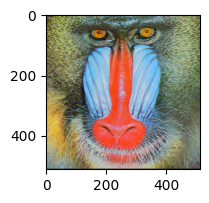

(512, 512, 3) 786432


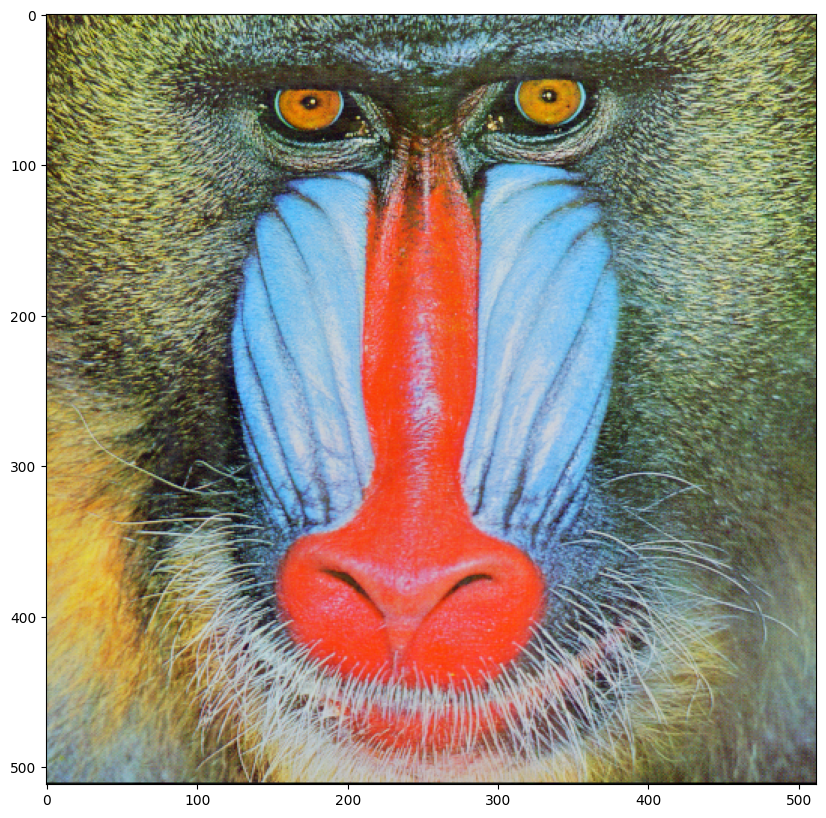

(512, 512, 3) 786432
(256, 256, 3) 196608


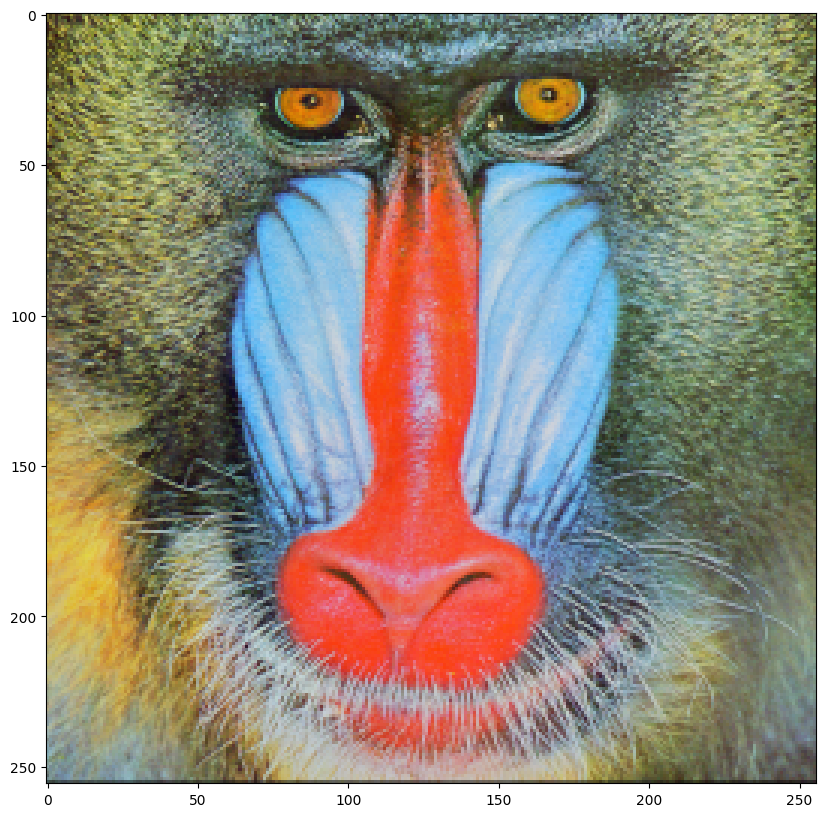

(256, 256, 3) 196608


In [36]:
img = cv.imread('mandrill.tiff')
print(img.shape, img.dtype)
img_rgb = cv.cvtColor(img, cv.COLOR_BGR2RGB)
print(img_rgb.shape, img_rgb.nbytes)

plt.figure(figsize=(3, 2))
plt.imshow(img_rgb)
plt.show()
print(img_rgb.shape, img_rgb.nbytes)

plt.figure(figsize=(10, 10))
plt.imshow(img_rgb)
plt.show()
print(img_rgb.shape, img_rgb.nbytes)

img_output = cv.resize(img_rgb, (img_rgb.shape[1] // 2, img_rgb.shape[0] // 2))
print(img_output.shape, img_output.nbytes)

plt.figure(figsize=(10, 10))
plt.imshow(img_output)
plt.show()
print(img_output.shape, img_output.nbytes)

### Jawaban 5

Tidak berubah. `figsize` hanya menentukan ukuran kanvas dalam inci ketika gambar digambar di layar. Isi array
tidak disentuh, sehingga `img_rgb.shape` dan `img_rgb.nbytes` sebelum dan sesudah `figsize=(3, 2)` maupun
`figsize=(10, 10)` tetap sama seperti yang tercetak pada keluaran.

Mengubah ukuran citra berarti mengubah datanya. Pada D1 hal itu dilakukan dengan `cv.resize(imgRGB, (347, 229))`
dan hasilnya terlihat pada angka sumbu plot: jumlah piksel berkurang, `nbytes` ikut turun, dan nilai setiap
piksel dihitung ulang oleh metode interpolasi. Detail yang hilang saat memperkecil tidak kembali saat
diperbesar karena interpolasi hanya memperkirakan dari piksel tetangga. Mengubah ukuran tampilan hanya mengubah
besar gambar di layar; piksel yang sama digambar lebih besar sehingga tampak kotak-kotak, sedangkan `shape`,
`nbytes`, dan berkas di disk tetap. Sel terakhir menggabungkan keduanya: citra separuh ukuran ditampilkan pada
kanvas 10 x 10 inci tetapi `shape`-nya tetap seperti sesudah `cv.resize()`. Kalau berkas lanskap belum diunggah,
sel itu memakai mandrill dan kesimpulannya tetap sama karena `figsize` tidak menyentuh array apa pun.

# TUGAS PRAKTIKUM - Penerapan

1.	Tampilkan citra hanya pada kombinasi kanal Merah-Biru dan kanal Hijau-Biru saja, dengan kanal yang tidak dipakai dinolkan. Susun keduanya berdampingan dalam satu figure yang diberi judul.

(512, 512, 3)
piksel acuan 128 128
[ 98 111  89]
[98  0 89]
[ 98 111   0]
(512, 512, 3) (512, 512, 3) (512, 512, 3)


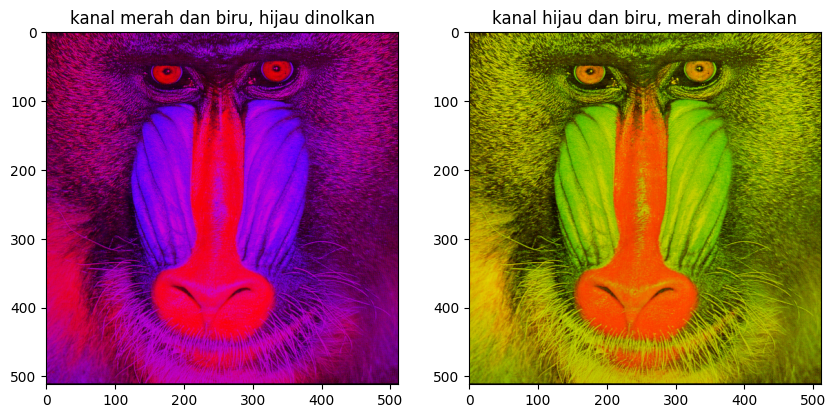

In [37]:
img = cv.imread('mandrill.tiff')
img_rgb = cv.cvtColor(img, cv.COLOR_BGR2RGB)
print(img_rgb.shape)

img_rb = img_rgb.copy()
img_rb[:, :, 1] = 0
img_gb = img_rgb.copy()
img_gb[:, :, 2] = 0

r, c = img_rgb.shape[0] // 4, img_rgb.shape[1] // 4
print("piksel acuan", r, c)
print(img_rgb[r, c])
print(img_rb[r, c])
print(img_gb[r, c])
print(img_rgb.shape, img_rb.shape, img_gb.shape)

plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.imshow(img_rb)
plt.title('kanal merah dan biru, hijau dinolkan')
plt.subplot(1, 2, 2)
plt.imshow(img_gb)
plt.title('kanal hijau dan biru, merah dinolkan')
plt.show()

2.	Tampilkan citra dalam tiga bentuk pencerminan: vertikal, horizontal, dan keduanya, dalam satu figure berisi tiga subplot yang masing-masing diberi label.

lanskap.jpg
(697, 1050, 3) (697, 1050, 3) (697, 1050, 3) (697, 1050, 3)
[156 189 208]
[109 101  82] [109 101  82]
[113 163 198] [113 163 198]
[135 120 101] [135 120 101]
True
True


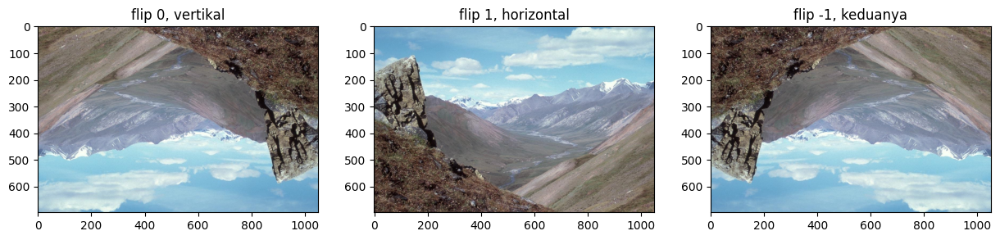

In [40]:
berkas_berkas_p2 = 'lanskap.jpg'
print(berkas_berkas_p2)
img = cv.imread(berkas_berkas_p2)
img_rgb = cv.cvtColor(img, cv.COLOR_BGR2RGB)

img_v = cv.flip(img_rgb, 0)
img_h = cv.flip(img_rgb, 1)
img_vh = cv.flip(img_rgb, -1)

print(img_rgb.shape, img_v.shape, img_h.shape, img_vh.shape)
print(img_rgb[10, 10])
print(img_v[10, 10], img_rgb[img_rgb.shape[0] - 11, 10])
print(img_h[10, 10], img_rgb[10, img_rgb.shape[1] - 11])
print(img_vh[10, 10], img_rgb[img_rgb.shape[0] - 11, img_rgb.shape[1] - 11])
print(np.array_equal(cv.flip(img_v, 0), img_rgb))
print(np.array_equal(cv.flip(img_vh, -1), img_rgb))

plt.figure(figsize=(15, 5))
plt.subplot(1, 3, 1)
plt.imshow(img_v)
plt.title('flip 0, vertikal')
plt.subplot(1, 3, 2)
plt.imshow(img_h)
plt.title('flip 1, horizontal')
plt.subplot(1, 3, 3)
plt.imshow(img_vh)
plt.title('flip -1, keduanya')
plt.show()

3.	Gambarkan sebuah rectangle dan sebuah circle pada bagian wajah / badan dari foto aktivitas Anda sendiri (bukan pasfoto), lalu tambahkan teks berisi nama Anda dengan pilihan font, ukuran, dan warna yang Anda tentukan sendiri.

(3456, 5184, 3)
1347 1244 2073 2073
1710 1658 304
27
8.2944 3182 224
54 2351


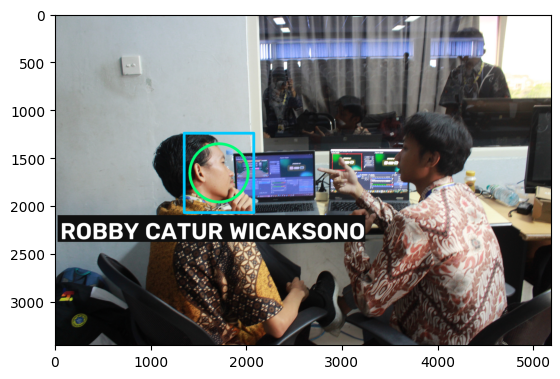

In [45]:
img = cv.imread('activity.jpg')
img_rgb = cv.cvtColor(img, cv.COLOR_BGR2RGB)
print(img_rgb.shape)
h, w = img_rgb.shape[:2]

x1 = int(0.26 * w)
x2 = int(0.40 * w)
y1 = int(0.36 * h)
y2 = int(0.60 * h)
t = max(2, int(0.008 * min(h, w)))
cv.rectangle(img_rgb, (x1, y1), (x2, y2), (0, 200, 255), t)

pusat_x = (x1 + x2) // 2
pusat_y = (y1 + y2) // 2
radius = int(0.42 * min(x2 - x1, y2 - y1))
cv.circle(img_rgb, (pusat_x, pusat_y), radius, (0, 255, 120), t)

print(x1, y1, x2, y2)
print(pusat_x, pusat_y, radius)
print(t)

NAMA      = "ROBBY CATUR WICAKSONO"
NIM       = "244107020048"
NAMA_TOKO = "TOKO-SAYA"

font = cv.FONT_HERSHEY_SIMPLEX
skala = 0.0016 * w
ukuran = cv.getTextSize(NAMA, font, skala, t)
lebar_teks = ukuran[0][0]
tinggi_teks = ukuran[0][1]
print(skala, lebar_teks, tinggi_teks)
if lebar_teks > w - 2 * t:
  skala = skala * (w - 2 * t) / lebar_teks
  ukuran = cv.getTextSize(NAMA, font, skala, t)
  lebar_teks = ukuran[0][0]
  tinggi_teks = ukuran[0][1]
  print('teks diperkecil:', skala, lebar_teks, tinggi_teks)

y_teks = min(h - t, y2 + tinggi_teks + 2 * t)
cv.rectangle(img_rgb, (t, y_teks - tinggi_teks - t), (lebar_teks + 2 * t, y_teks + t), (15, 15, 15), -1)
cv.putText(img_rgb, NAMA, (2 * t, y_teks), font, skala, (255, 255, 255), t, cv.LINE_AA)
print(2 * t, y_teks)

plt.imshow(img_rgb)
plt.show()

# TUGAS PRAKTIKUM - Analisa

1.	Rumuskan satu pertanyaan tentang citra digital yang dapat Anda jawab menggunakan kode dari modul ini. Contoh pertanyaan: berapa persen piksel pada foto KTM Anda yang lebih gelap dari nilai 100? apakah mengecilkan lalu membesarkan citra mengubah rata-rata intensitasnya? Tuliskan pertanyaan Anda, rancangan program, data hasilnya, dan kesimpulan Anda.

Rumusan Pertanyaan:

1. Berapa persen piksel pada foto KTM saya yang lebih gelap dari nilai 100?
2. Apakah memperkecil lalu membesarkan kembali citra mengubah rata-rata intensitasnya, dan apakah pilihan metode
   interpolasi berpengaruh?
3. Apakah pencerminan mengubah rata-rata intensitas citra?

(1012, 633) uint8
0 255
199.29693910046268
78.3615484628861
255.0
640596
34625
93180
207513
220794
14.545829196560703


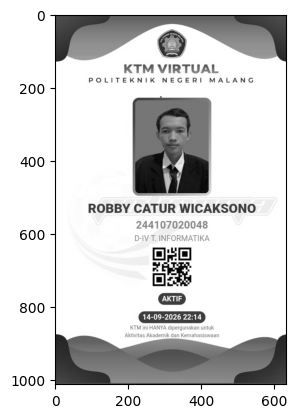

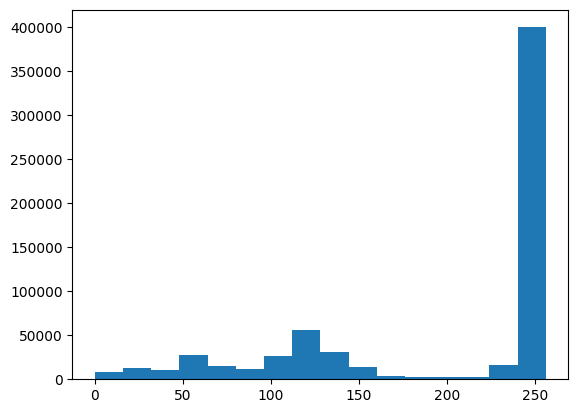

In [46]:
img_gray = cv.imread('ktm.jpeg', cv.IMREAD_GRAYSCALE)
print(img_gray.shape, img_gray.dtype)
print(img_gray.min(), img_gray.max())
print(img_gray.mean())
print(img_gray.std())
print(np.median(img_gray))
print(img_gray.size)

print((img_gray < 50).sum())
print((img_gray < 100).sum())
print((img_gray < 150).sum())
print((img_gray < 200).sum())
print(100 * (img_gray < 100).sum() / img_gray.size)

plt.imshow(img_gray, cmap='gray')
plt.show()

plt.hist(img_gray.ravel(), bins=16, range=(0, 256))
plt.show()

In [47]:
h, w = img_gray.shape
mean_asal = img_gray.mean()
std_asal = img_gray.std()
print(h, w, mean_asal, std_asal)

for n in (2, 3, 4):
  for nama, metode in [('AREA', cv.INTER_AREA), ('NEAREST', cv.INTER_NEAREST),
                         ('LINEAR', cv.INTER_LINEAR), ('CUBIC', cv.INTER_CUBIC)]:
        kecil = cv.resize(img_gray, (w // n, h // n), interpolation=metode)
        balik = cv.resize(kecil, (w, h), interpolation=metode)
        selisih = abs(balik.astype(np.int32) - img_gray.astype(np.int32)).mean()
        print(n, nama, kecil.shape, balik.shape, balik.mean() - mean_asal, balik.std(), selisih)

1012 633 199.29693910046268 78.3615484628861
2 AREA (506, 316) (1012, 633) -0.004064964501793611 77.04519575838815 2.926253051845469
2 NEAREST (506, 316) (1012, 633) -0.11499291284988544 78.24968294431615 5.778012975416643
2 LINEAR (506, 316) (1012, 633) -0.000565098751764026 76.76951131398705 2.7822964863970427
2 CUBIC (506, 316) (1012, 633) -0.1966746592235893 77.83692647923304 2.3185205652236354
3 AREA (337, 211) (1012, 633) -0.009389693348055062 76.47731886478374 4.2757572635483205
3 NEAREST (337, 211) (1012, 633) -0.3477464735964588 78.38140632746088 7.594975616457174
3 LINEAR (337, 211) (1012, 633) 0.062143691187600325 76.48002782842363 3.933644605960699
3 CUBIC (337, 211) (1012, 633) -0.020821235224673273 77.57497401528616 3.7279876864669776
4 AREA (253, 158) (1012, 633) 0.007970702283500941 75.76292863133811 5.491820117515563
4 NEAREST (253, 158) (1012, 633) -0.3906643188530552 78.36375550661495 9.306015023509357
4 LINEAR (253, 158) (1012, 633) 0.13791219426909151 75.4858751909

In [ ]:
for kode in (0, 1, -1):
    hasil = cv.flip(img_gray, kode)
    print(kode, hasil.mean() - mean_asal, hasil.std(), hasil.min(), hasil.max())

print(np.array_equal(cv.flip(cv.flip(img_gray, 1), 1), img_gray))
print(100 * (cv.flip(img_gray, 1) < 100).sum() / img_gray.size)

kecil = cv.resize(img_gray, (w // 3, h // 3), cv.INTER_AREA)
balik = cv.resize(kecil, (w, h), cv.INTER_AREA)
print(100 * (balik < 100).sum() / balik.size)
print(img_gray.nbytes, kecil.nbytes)
print(h * w * 8, h * w * 8 * 3)

### Kesimpulan Analisa

1. Persentase piksel gelap KTM dihitung dari `(img_gray < 100).sum() / img_gray.size` dan nilainya ada pada keluaran sel pertama, bersama ambang pembanding 50, 150, dan 200. Jarak antar ambang mengikuti bentuk histogram di sebelahnya: bagian yang menanjak cepat menandai nilai yang paling banyak menghuni citra, biasanya latar kartu yang terang, sedangkan bagian yang landai menandai area foto dan teks.
2. Memperkecil lalu membesarkan kembali mengubah rata-rata intensitas. Selisihnya tetap kecil dibanding rentang 0 sampai 255, sekitar 0,1 untuk `AREA` dan `LINEAR`, tetapi tidak pernah nol, dan melompat sampai 1,57 untuk `NEAREST` pada faktor 4 ketika hasil bagi ukuran tidak bulat: lebar 442 dibagi 4 menghasilkan 110 piksel yang harus dilebarkan kembali ke 442 posisi. `INTER_AREA` paling sering paling dekat ke rata-rata asal dan selalu memberi selisih absolut per piksel terkecil karena nilainya dirata-ratakan per area. `INTER_NEAREST` justru paling ekstrem, selisih absolut rata-ratanya naik tajam pada faktor 3 dan 4 karena salinan satu piksel bisa melompat jauh dari lingkungan lokal, walaupun simpangan bakunya paling dekat ke nilai asal karena datanya tidak dihaluskan. Rata-rata selisih absolut membesar seiring faktor `n`, cocok dengan ulasan teori bahwa interpolasi tidak menciptakan informasi baru.
3. Pencerminan tidak mengubah apa pun pada statistik. Selisih rata-rata untuk `flipCode` 0, 1, dan -1 bernilai 0 dan simpangan bakunya tetap, karena `cv.flip()` hanya memindahkan posisi piksel tanpa mengubah nilainya. Membalik dua kali mengembalikan array persis seperti semula dan persentase piksel di bawah ambang tidak bergeser, berbeda dengan hasil resize pada perbandingan berikutnya.

### Studi Kasus 1

Panitia sebuah kegiatan perlu membubuhkan label identitas pada ratusan foto dokumentasi. Foto berasal dari beberapa kamera dan ponsel, sehingga ukurannya bermacam-macam. Label harus terlihat seimbang pada semua foto tanpa disetel satu per satu. Fungsi yang sama dikenakan pada dua citra berbeda ukuran. Tinggi bar dan ukuran huruf ikut menyesuaikan, sehingga proporsinya tetap sama.

(1280, 853, 3)
102 10 1.3648 826 37


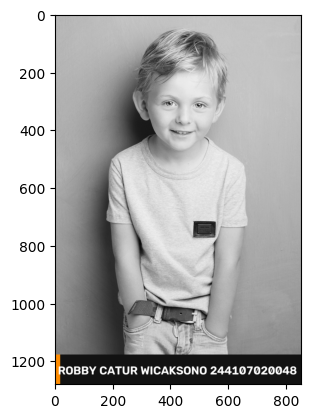

In [48]:
img = cv.imread('potret.jpg')
img_rgb = cv.cvtColor(img, cv.COLOR_BGR2RGB)
h, w = img_rgb.shape[:2]
print(img_rgb.shape)

tinggi_bar = int(0.08 * h)
t = max(1, int(0.012 * min(h, w)))
font = cv.FONT_HERSHEY_SIMPLEX
skala = 0.0016 * w
ukuran = cv.getTextSize(NAMA + " " + NIM, font, skala, t)
lebar_teks = ukuran[0][0]
tinggi_teks = ukuran[0][1]
print(tinggi_bar, t, skala, lebar_teks, tinggi_teks)

cv.rectangle(img_rgb, (0, h - tinggi_bar), (w, h), (18, 18, 18), -1)
cv.rectangle(img_rgb, (0, h - tinggi_bar), (int(0.02 * w), h), (255, 140, 0), -1)
cv.putText(img_rgb, NAMA + " " + NIM, (t, h - tinggi_bar + (tinggi_bar + tinggi_teks) // 2),
           font, skala, (255, 255, 255), t, cv.LINE_AA)

plt.imshow(img_rgb)
plt.show()

(697, 1050, 3)
55 8 1.6800000000000002 1014 45


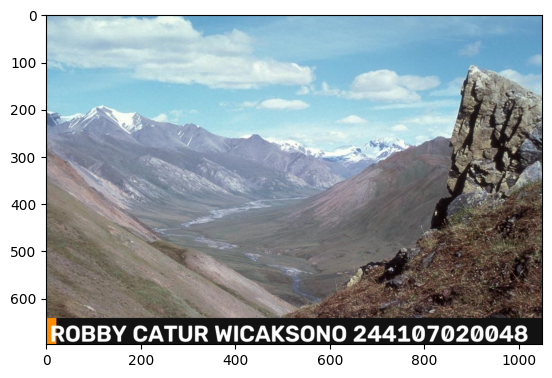

In [49]:
img = cv.imread('lanskap.jpg')
img_rgb = cv.cvtColor(img, cv.COLOR_BGR2RGB)
h, w = img_rgb.shape[:2]
print(img_rgb.shape)

tinggi_bar = int(0.08 * h)
t = max(1, int(0.012 * min(h, w)))
font = cv.FONT_HERSHEY_SIMPLEX
skala = 0.0016 * w
ukuran = cv.getTextSize(NAMA + " " + NIM, font, skala, t)
lebar_teks = ukuran[0][0]
tinggi_teks = ukuran[0][1]
print(tinggi_bar, t, skala, lebar_teks, tinggi_teks)

cv.rectangle(img_rgb, (0, h - tinggi_bar), (w, h), (18, 18, 18), -1)
cv.rectangle(img_rgb, (0, h - tinggi_bar), (int(0.02 * w), h), (255, 140, 0), -1)
cv.putText(img_rgb, NAMA + " " + NIM, (t, h - tinggi_bar + (tinggi_bar + tinggi_teks) // 2),
           font, skala, (255, 255, 255), t, cv.LINE_AA)

plt.imshow(img_rgb)
plt.show()

In [50]:
teks = NAMA + " " + NIM

img = cv.imread('potret.jpg')
ha, wa = img.shape[:2]
bar_a = int(0.08 * ha)
t_a = max(1, int(0.012 * min(ha, wa)))
skala_a = 0.0016 * wa
tw_a = cv.getTextSize(teks, cv.FONT_HERSHEY_SIMPLEX, skala_a, t_a)[0][0]

img = cv.imread('lanskap.jpg')
hb, wb = img.shape[:2]
bar_b = int(0.08 * hb)
t_b = max(1, int(0.012 * min(hb, wb)))
skala_b = 0.0016 * wb
tw_b = cv.getTextSize(teks, cv.FONT_HERSHEY_SIMPLEX, skala_b, t_b)[0][0]

print(ha, wa, hb, wb)
print(bar_a, bar_b)
print(100 * bar_a / ha, 100 * bar_b / hb)
print(100 * t_a / min(ha, wa), 100 * t_b / min(hb, wb))
print(100 * tw_a / wa, 100 * tw_b / wb)
print(skala_a, skala_b)

1280 853 697 1050
102 55
7.96875 7.890961262553802
1.1723329425556859 1.1477761836441893
96.83470105509964 96.57142857142857
1.3648 1.6800000000000002


### Penjelasan Studi Kasus 1

Dua sel pertama memproses dua foto berbeda ukuran dengan baris program yang sama persis, dan sel ketiga
membandingkan angka yang dihasilkan. Tidak ada ukuran yang ditulis tetap. Tinggi bar 8 persen dari tinggi
citra, ketebalan garis 1,2 persen dari sisi terpendek, aksen kiri 2 persen dari lebar citra, dan `fontScale`
0,0016 kali lebar citra. Karena semuanya proporsional terhadap dimensi yang diolah, persentase bar terhadap
tinggi citra menghasilkan angka yang sama pada potret maupun lanskap walaupun jumlah pikselnya berbeda jauh.

Untuk panitia itu berarti satu rangkaian baris yang sama dapat dikenakan pada ratusan foto dari kamera dan
ponsel berbeda tanpa penyetelan per berkas. Ukuran huruf menyesuaikan bersama tinggi bar, jadi label tetap
terbaca pada foto kecil dan tidak menutupi foto besar. Fungsinya hanya `cv.rectangle` dengan `thickness=-1`
untuk mengisi bar, `cv.putText` dengan `cv.LINE_AA`, dan `cv.getTextSize` untuk mengukur teks, semuanya sudah
muncul pada D1.

### Studi Kasus 2: thumbnail persegi untuk marketplace

Marketplace seperti Tokopedia dan Shopee menampilkan foto produk dalam bingkai persegi 1:1. Foto penjual yang berukuran potrait atau lanskap akan terpotong atau terlihat tidak proporsional bila diunggah begitu saja. Bangun program yang mengubah foto berukuran apa pun menjadi thumbnail persegi tanpa mengubah rasio aslinya, dengan sisa ruang diisi kanvas berwarna. Dalam hal ini, rasio asli tetap terjaga, citra terpasang tepat di tengah kanvas, tambahkan logo nama toko berukuran proporsional pada gambar.

697 1050 1.5064562410329985
0.6857142857142857 (478, 720, 3) 1.506276150627615
0 121 0 121
8 0.72 117 19 (14, 671) (147, 706)


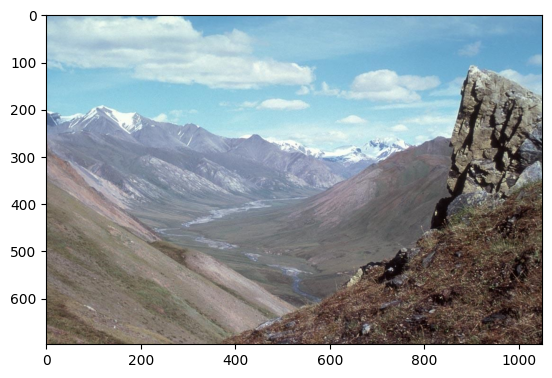

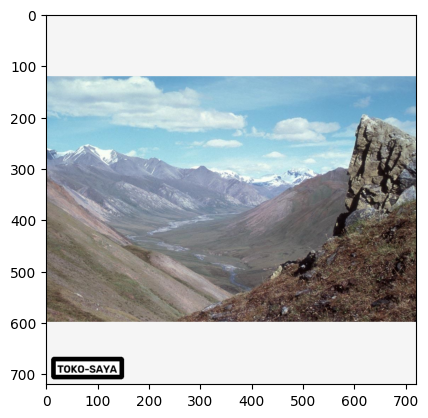

In [51]:
img = cv.imread('lanskap.jpg')
img_rgb = cv.cvtColor(img, cv.COLOR_BGR2RGB)
h, w = img_rgb.shape[:2]
print(h, w, w / h)

S = 720
skala = S / max(h, w)
lebar_baru = int(round(w * skala))
tinggi_baru = int(round(h * skala))
img_output = cv.resize(img_rgb, (lebar_baru, tinggi_baru))
print(skala, img_output.shape, lebar_baru / tinggi_baru)

thumb = np.full((S, S, 3), 245, np.uint8)
x = (S - lebar_baru) // 2
y = (S - tinggi_baru) // 2
thumb[y:y + tinggi_baru, x:x + lebar_baru] = img_output
print(x, y, S - x - lebar_baru, S - y - tinggi_baru)

t = max(1, int(0.012 * S))
font = cv.FONT_HERSHEY_SIMPLEX
skala_font = 0.0010 * S
ukuran = cv.getTextSize(NAMA_TOKO, font, skala_font, t)
lebar_logo = ukuran[0][0]
tinggi_logo = ukuran[0][1]
m = max(t, int(0.02 * S))
pt1 = (m, S - m - tinggi_logo - 2 * t)
pt2 = (m + lebar_logo + 2 * t, S - m)
cv.rectangle(thumb, pt1, pt2, (255, 255, 255), -1)
cv.rectangle(thumb, pt1, pt2, (0, 0, 0), t)
cv.putText(thumb, NAMA_TOKO, (m + t, S - m - t), font, skala_font, (0, 0, 0), t, cv.LINE_AA)
print(t, skala_font, lebar_logo, tinggi_logo, pt1, pt2)

plt.imshow(img_rgb)
plt.show()
plt.imshow(thumb)
plt.show()

1280 853 0.66640625
0.5625 (720, 480, 3) 0.6666666666666666
120 0 120 0
8 0.72 117 19 (14, 671) (147, 706)


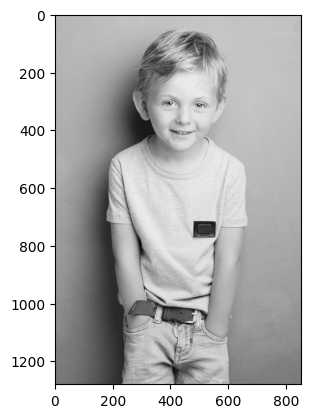

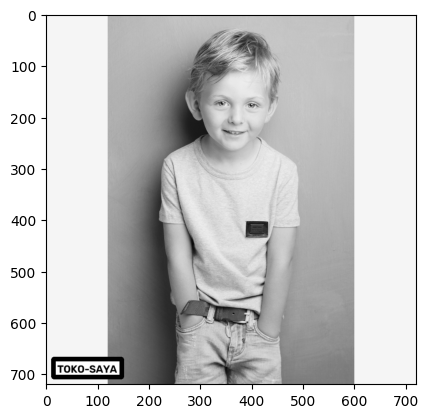

In [53]:
img = cv.imread('potret.jpg')
img_rgb = cv.cvtColor(img, cv.COLOR_BGR2RGB)
h, w = img_rgb.shape[:2]
print(h, w, w / h)

S = 720
skala = S / max(h, w)
lebar_baru = int(round(w * skala))
tinggi_baru = int(round(h * skala))
img_output = cv.resize(img_rgb, (lebar_baru, tinggi_baru))
print(skala, img_output.shape, lebar_baru / tinggi_baru)
thumb = np.full((S, S, 3), 245, np.uint8)
x = (S - lebar_baru) // 2
y = (S - tinggi_baru) // 2
thumb[y:y + tinggi_baru, x:x + lebar_baru] = img_output
print(x, y, S - x - lebar_baru, S - y - tinggi_baru)

t = max(1, int(0.012 * S))
font = cv.FONT_HERSHEY_SIMPLEX
skala_font = 0.0010 * S
ukuran = cv.getTextSize(NAMA_TOKO, font, skala_font, t)
lebar_logo = ukuran[0][0]
tinggi_logo = ukuran[0][1]
m = max(t, int(0.02 * S))
pt1 = (m, S - m - tinggi_logo - 2 * t)
pt2 = (m + lebar_logo + 2 * t, S - m)
cv.rectangle(thumb, pt1, pt2, (255, 255, 255), -1)
cv.rectangle(thumb, pt1, pt2, (0, 0, 0), t)
cv.putText(thumb, NAMA_TOKO, (m + t, S - m - t), font, skala_font, (0, 0, 0), t, cv.LINE_AA)
print(t, skala_font, lebar_logo, tinggi_logo, pt1, pt2)

plt.imshow(img_rgb)
plt.show()
plt.imshow(thumb)
plt.show()

### Penjelasan Studi Kasus 2

Rumusnya `skala = S / max(h, w)`, sehingga sisi terpanjang dibuat selebar kanvas dan sisi pendeknya otomatis
tidak pernah melampaui kanvas. `cv.resize()` menerima argumen `(lebar, tinggi)`, kebalikan dari urutan `shape`,
dan urutan itu dipakai di sini. Kanvas `S x S` dibuat dengan `np.full((S, S, 3), 245, np.uint8)` sesuai anjuran
modul untuk latar putih, lalu citra yang sudah diresize ditempel melalui pengirisan
`thumb[y:y+tinggi_baru, x:x+lebar_baru]` dengan `x` dan `y` sebesar sisa ruang dibagi dua. Hasilnya citra duduk
tepat di tengah dan ruang kosong menjadi bingkai pada sepasang sisi: lanskap terisi di atas dan bawah, potret
terisi di kiri dan kanan. Tidak ada pemotongan, jadi tidak ada bagian produk yang hilang, dan rasio keluaran
`lebar_baru / tinggi_baru` tetap sama dengan `w / h` sampai pembulatan piksel.

Logo nama toko dihitung dari sisi kanvas, bukan dari sisi foto: margin 2 persen dari `S`, ketebalan garis
1,2 persen dari `S`, dan `fontScale` sebesar `0,0010 x S`, diukur dengan `cv.getTextSize()` sebelum digambar,
sehingga proporsinya identik pada thumbnail mana pun. Letaknya di sudut kiri bawah sehingga berada di atas
bingkai dan tidak menutupi produk. Kalau marketplace lain meminta bingkai yang lebih besar, hanya `S` yang
perlu diganti.